In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

tensorflow_path = "C:\\Users\\ASUS\\AppData\\Local\\Programs\\Python\\Python35\\Lib\\site-packages\\tensorflow"
sys.path.append(tensorflow_path + "\\models\\research\\")
sys.path.append(tensorflow_path + "\\models\\research\\object_detection")
sys.path.append(tensorflow_path + "\\models\\research\\object_detection\\utils")

# This is needed since the notebook is stored in the object_detection folder.
#sys.path.append("..")
from utils import ops as utils_ops# from models.research.object_detection.utils import ops as utils_ops
from utils import label_map_util #from models.research.object_detection.utils import label_map_util
from utils import visualization_utils as vis_util #from models.research.object_detection.utils import visualization_utils as vis_util
%matplotlib inline

D:\triangle\deeplearning\convolutional-pose-machines-tensorflow\utils\visualization_utils.py:25: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Users\ASUS\Anaconda3\envs\tensorflow\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\ASUS\Anaconda3\envs\tensorflow\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\ASUS\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\ASUS\Anaconda3\envs\tensorflow\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\ASUS\Anaconda3\envs\tensorflow\lib\sit

In [2]:
PATH_TO_CKPT = 'D:\\triangle\\deeplearning\\175project\\face_inference_graph\\frozen_inference_graph.pb'
PATH_TO_LABELS = 'D:\\triangle\\deeplearning\\175project\\hand_label_map.pbtxt'
NUM_CLASSES = 1

#load frozen model into memory
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [3]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

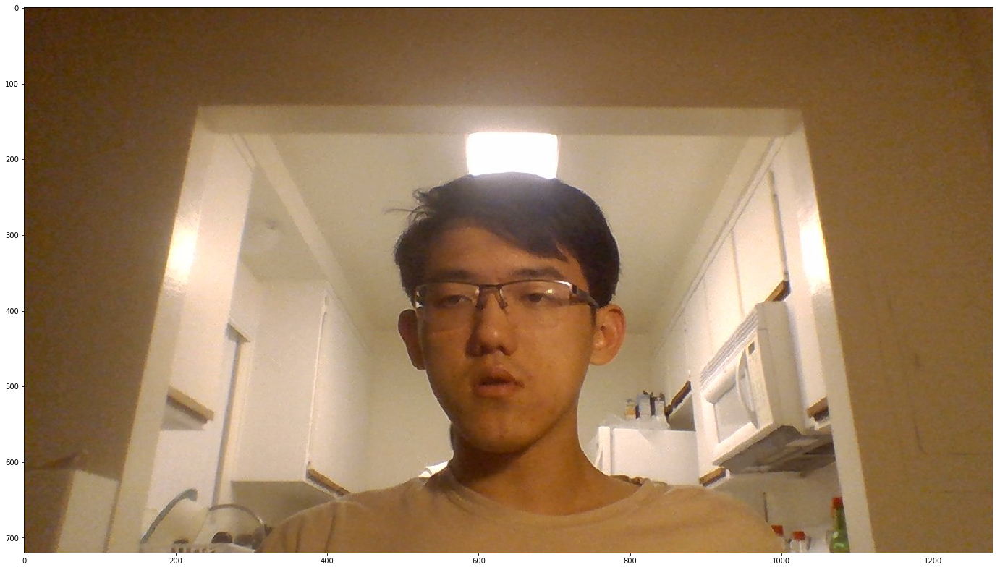

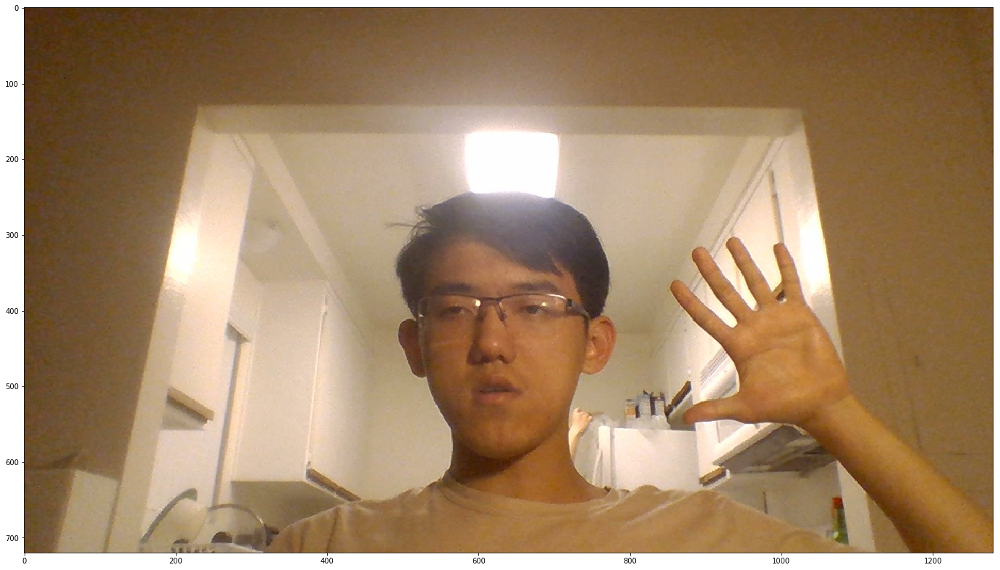

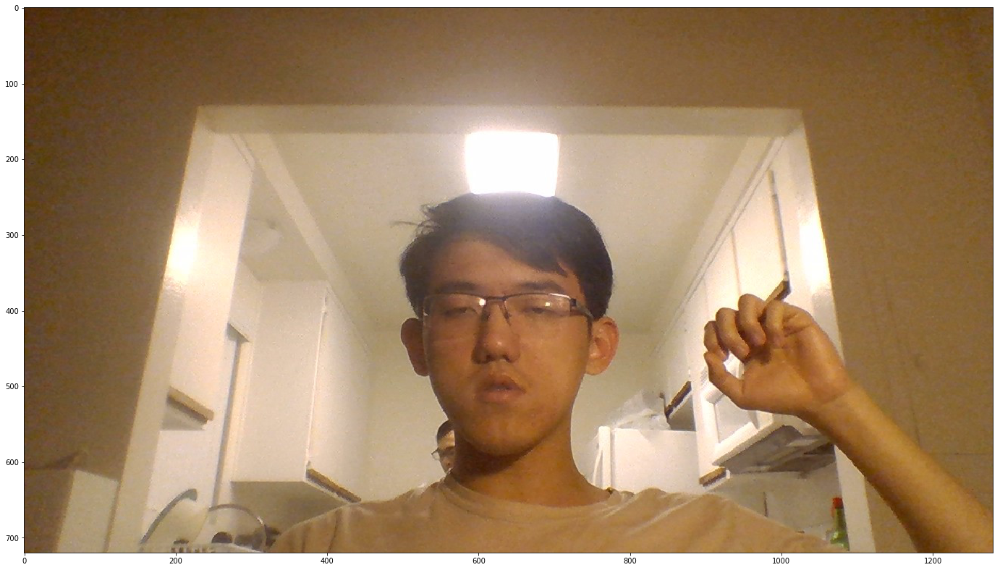

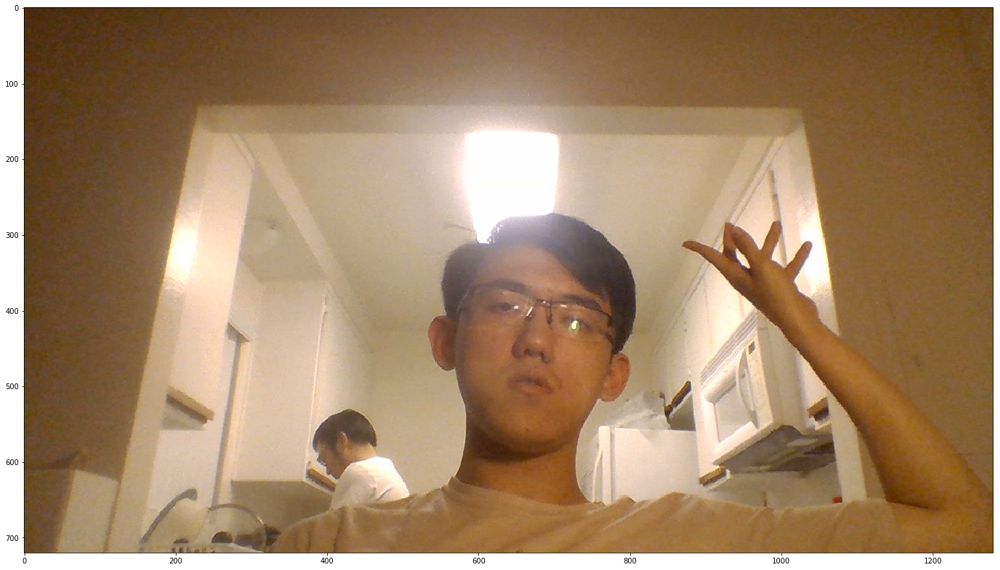

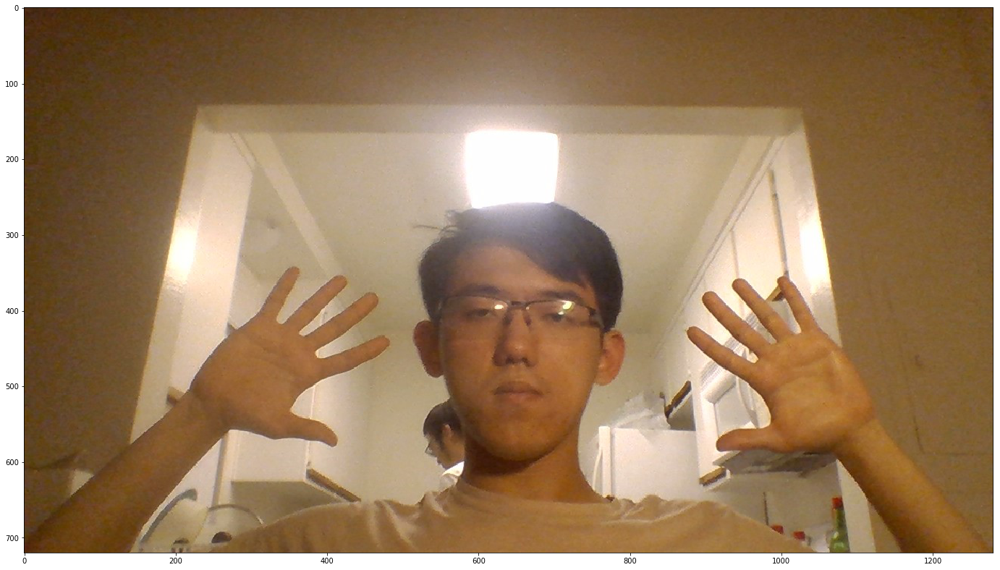

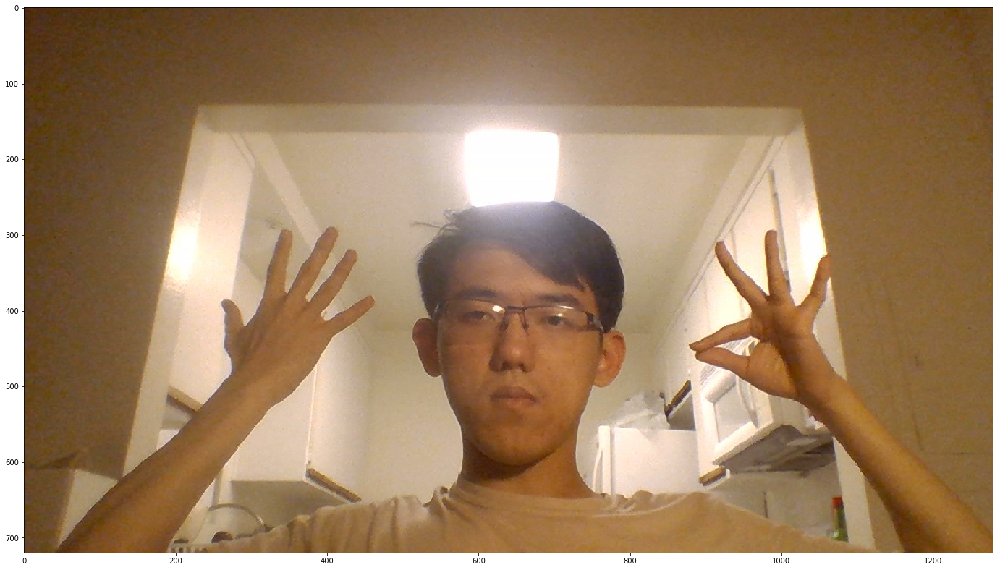

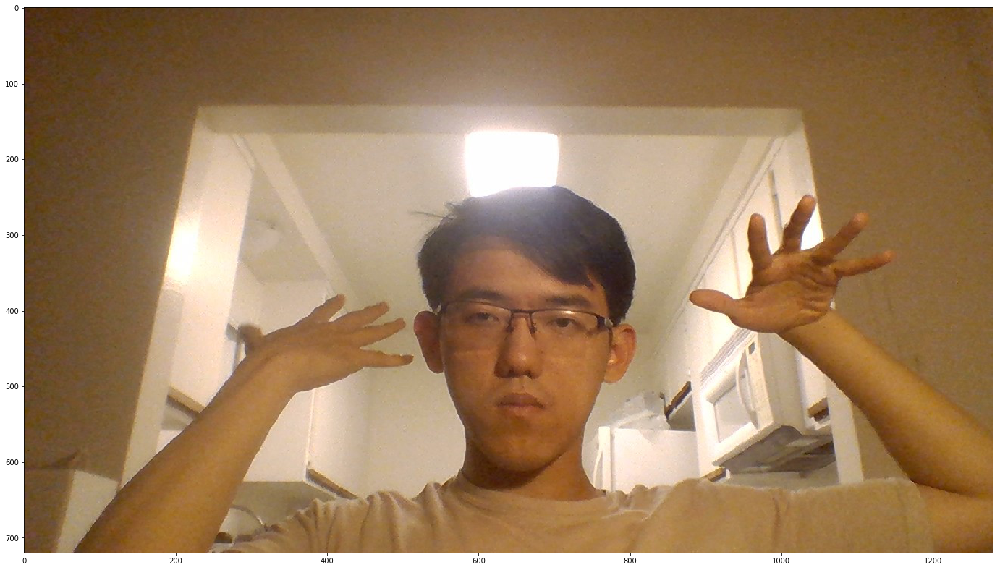

In [4]:
#image path
PATH_TO_TEST_IMAGES_DIR = 'D:\\triangle\\deeplearning\\175project\\hand_pose\\test_img' #'D:\\triangle\\deeplearning\\175project\\hand_pose\\test_img' #'models/research/object_detection/test_images'#
TEST_IMAGE_PATHS = os.listdir(PATH_TO_TEST_IMAGES_DIR) #[ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 5) ]#
IMAGE_SIZE = (12, 8)

for image_path in TEST_IMAGE_PATHS:
    image = Image.open(os.path.join(PATH_TO_TEST_IMAGES_DIR, image_path)) # Image.open(image_path) #
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    
    ######################################################################################################
    # Read me:                                                                                           #
    # detection_boxes, detection_classes, detection_scores should have the same length N, which is the N #
    # most-likely bounds, which can be of any labels.                                                    #
    # boxes represent the bound values of N bounds                                                       #
    # classes represent the class each corresponding bound belong to, differed by colors                 #
    # score represent the likelihood of an object to be of that class, but only a > 0.5 one will be shown#
    ######################################################################################################
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],  #np.array([[8e-01, 2e-01, 6e-01, 4e-01]]), #
        #upper bound, left bound, bottom bound, right bound, these coefficient multiply by width/height
        #records bounds for the first 100 most-possible exist objects.
        #but the bound is shown or not depend on the score > 0.5, and the color depends on what is the class
        
        output_dict['detection_classes'], #np.array([3,2,1,4]), #
        #this is the class label, in our case only one class is used, so the only value will be 1
        
        output_dict['detection_scores'], #np.array([0.500001, 0.7, 0.6, 0]),#
        #this is the score & similarity, each score that is beyond 0.5(0.5000001 is fine) will be taken
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=8)
    plt.figure(figsize=(24,16)) #IMAGE_SIZE)
    plt.imshow(image_np)

In [ ]:
#this block is to derive the bounding box 

#image path
PATH_TO_TEST_IMAGES_DIR = 'models/research/object_detection/test_images'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 19) ]
IMAGE_SIZE = (12, 8)

# this section finds one/two bound(s) according to xmin, ymin, xmax, ymax
for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    height, width, _ = image_np.shape
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    tmp = output_dict['detection_boxes'][::-1]
    
    predict_list = []
    if len(output_dict['detection_boxes']) >= 1 and output_dict['detection_scores'][0] > 0.5:
        output = output_dict['detection_boxes'][0,:]
        predict_list.append([output[1] * width, output[0] * height, output[3] * width, output[2] * height])
        
        if len(output_dict['detection_boxes']) >= 2 and output_dict['detection_scores'][1] > 0.5:
            output = output_dict['detection_boxes'][1,:]
            predict_list.append([output[1] * width, output[0] * height, output[3] * width, output[2] * height])
    print(predict_list)